# EDA

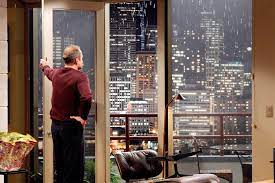

In [60]:

## BASIC SET UP

# Import required libraries

import warnings

warnings.filterwarnings("ignore")

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

# These lines of code were already there in the template

from matplotlib.ticker import PercentFormatter
plt.rcParams.update({ "figure.figsize" : (8, 5),"axes.facecolor" : "white", "axes.edgecolor":  "black"})
plt.rcParams["figure.facecolor"]= "w"
pd.plotting.register_matplotlib_converters()
pd.set_option('display.float_format', lambda x: '%.3f' % x)

In [61]:

## DATA LOADING

# Read data from .csv file 

df_housing = pd.read_csv('eda.csv')


In [62]:

## PRELIMINARY CHECK: HEAD

# Display first rows for all columns 

df_housing.head()


,id,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,...,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15,date,price,house_id
0,1,3.000,1.000,1180.000,5650.000,1.000,NaN,0.000,3,7,...,1955,0.000,98178,47.511,-122.257,1340.000,5650.000,2014-10-13,221900.000,7129300520
1,2,3.000,2.250,2570.000,7242.000,2.000,0.000,0.000,3,7,...,1951,19910.000,98125,47.721,-122.319,1690.000,7639.000,2014-12-09,538000.000,6414100192
2,3,2.000,1.000,770.000,10000.000,1.000,0.000,0.000,3,6,...,1933,NaN,98028,47.738,-122.233,2720.000,8062.000,2015-02-25,180000.000,5631500400
3,4,4.000,3.000,1960.000,5000.000,1.000,0.000,0.000,5,7,...,1965,0.000,98136,47.521,-122.393,1360.000,5000.000,2014-12-09,604000.000,2487200875
4,5,3.000,2.000,1680.000,8080.000,1.000,0.000,0.000,3,8,...,1987,0.000,98074,47.617,-122.045,1800.000,7503.000,2015-02-18,510000.000,1954400510


In [63]:

## PRELIMINARY CHECK: INFO

# Display information about data type and non-null entries 

df_housing.info()


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 21597 entries, 0 to 21596
Data columns (total 22 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   id             21597 non-null  int64  
 1   bedrooms       21597 non-null  float64
 2   bathrooms      21597 non-null  float64
 3   sqft_living    21597 non-null  float64
 4   sqft_lot       21597 non-null  float64
 5   floors         21597 non-null  float64
 6   waterfront     19206 non-null  float64
 7   view           21534 non-null  float64
 8   condition      21597 non-null  int64  
 9   grade          21597 non-null  int64  
 10  sqft_above     21597 non-null  float64
 11  sqft_basement  21145 non-null  float64
 12  yr_built       21597 non-null  int64  
 13  yr_renovated   17749 non-null  float64
 14  zipcode        21597 non-null  int64  
 15  lat            21597 non-null  float64
 16  long           21597 non-null  float64
 17  sqft_living15  21597 non-null  float64
 18  sqft_l

In [64]:

## DATA CLEANING: DATE 

# Convert content of "date" column to date 

df_housing["date"] = pd.to_datetime(df_housing["date"], format='%Y-%m-%d')

# Keep only the Y-M-D part

df_housing["date"] = df_housing["date"].dt.date

# Check that conversion worked 

print(type(df_housing["date"][0]))
print(df_housing["date"][0])

<class 'datetime.date'>
2014-10-13


In [65]:

## DATA CLEANING: YR_BUILT 

# Convert content of "yr_built" column to date 

df_housing["yr_built"] = pd.to_datetime(df_housing["yr_built"], format='%Y')

# Keep year part only

df_housing["yr_built"] = df_housing["yr_built"].dt.year

# Check that conversion worked (type will be int)

print(type(df_housing["yr_built"][0]))
print(df_housing["yr_built"][0])


<class 'numpy.int32'>
1955


In [66]:

## DATA CLEANING: YR_RENOVATED

# Convert NaN entries in "yr_renovated" column to null entries 

df_housing["yr_renovated"] = df_housing["yr_renovated"].replace(np.NaN, 0)

# Divide all entries in "yr_renovated" by 10

df_housing["yr_renovated"] = df_housing["yr_renovated"] / 10

# Convert all null entries in "yr_renovated" back to NaN

df_housing["yr_renovated"] = df_housing["yr_renovated"].replace(0, np.NaN)

# Check that everything worked (format will be float due to presence of NaNs)

print(df_housing["yr_renovated"].head())


0        NaN
1   1991.000
2        NaN
3        NaN
4        NaN
Name: yr_renovated, dtype: float64


In [67]:

## DATA CLEANING: IRRELEVANT COLUMNS

# Create copy of data frame

df = df_housing.copy()

# Drop irrelevant columns from new data frame

df.drop(["sqft_basement","bedrooms","bathrooms","sqft_living", "sqft_lot", "floors", "waterfront", "view","condition","grade","sqft_above","sqft_living15","sqft_lot15", "id","house_id"], axis=1, inplace=True)

# Check that it worked

df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 21597 entries, 0 to 21596
Data columns (total 7 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   yr_built      21597 non-null  int32  
 1   yr_renovated  744 non-null    float64
 2   zipcode       21597 non-null  int64  
 3   lat           21597 non-null  float64
 4   long          21597 non-null  float64
 5   date          21597 non-null  object 
 6   price         21597 non-null  float64
dtypes: float64(4), int32(1), int64(1), object(1)
memory usage: 1.1+ MB


<Axes: >

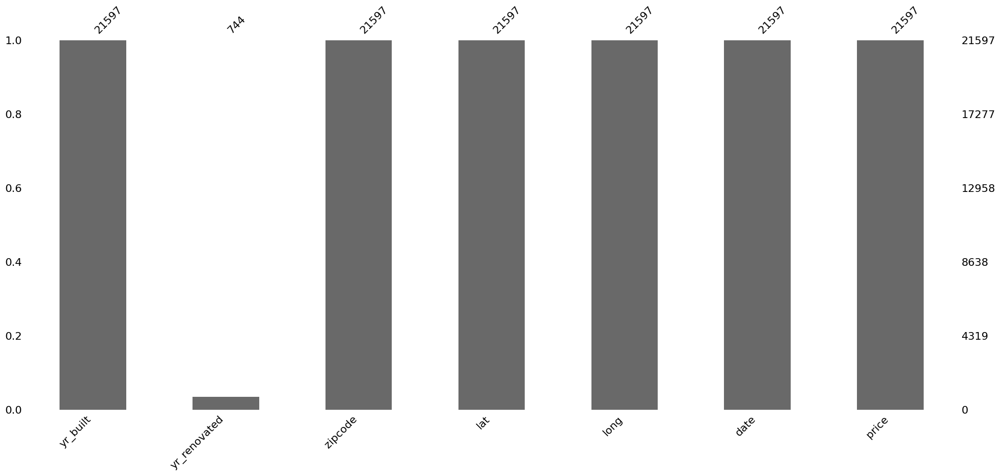

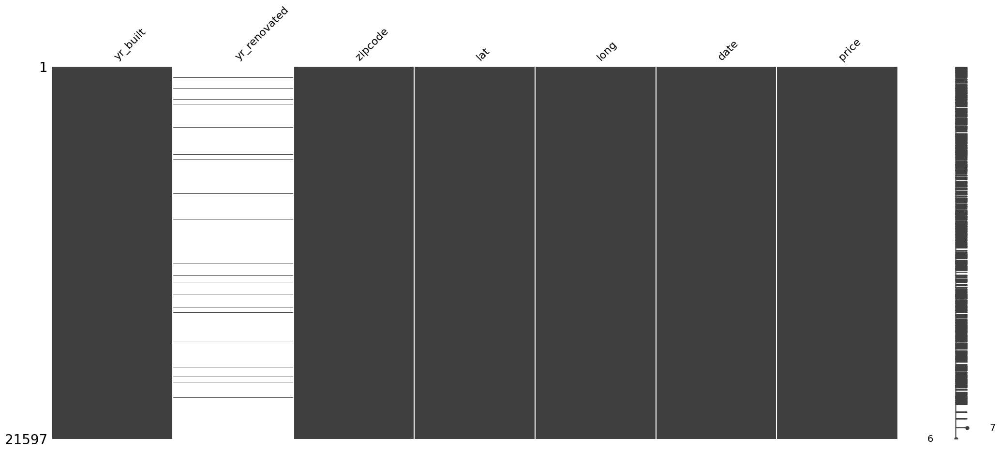

In [68]:

## DATA CLEANING: NAN CHECK

# Import missingno

import missingno as msno

# Visualize NaNs using bars

msno.bar(df)

# Visualize using matrix

msno.matrix(df)

In [69]:

## EDA: GEOGRAPHICAL ANALYSIS 

# Create new data frame 

df_prices = df.copy()

# Drop columns with date entries

df_prices.drop(["yr_renovated", "yr_built", "date"], axis=1, inplace=True)

# Group houses by zip code and calculate mean price per zip code

df_prices = df_prices.groupby("zipcode").mean()

# Reset index

df_prices.reset_index(inplace=True)

# Convert entries in "price" to int

df_prices["price"] = df_prices["price"].round().astype(int)

# Check that it all worked

print(df_prices)

    zipcode    lat     long    price
0     98001 47.309 -122.271   281195
1     98002 47.309 -122.213   234284
2     98003 47.316 -122.310   294111
3     98004 47.616 -122.205  1356524
4     98005 47.612 -122.167   810290
..      ...    ...      ...      ...
65    98177 47.742 -122.369   676419
66    98178 47.499 -122.247   310613
67    98188 47.447 -122.281   289078
68    98198 47.391 -122.316   302897
69    98199 47.648 -122.398   792188

[70 rows x 4 columns]


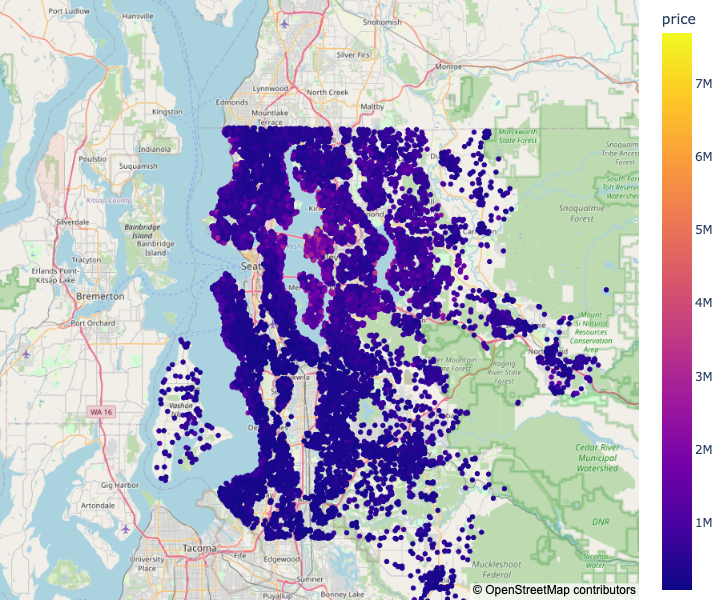

In [70]:

## VISUALIZATION: PRICE DISTRIBUTION IN MAP  

# Import plotly 

import plotly.express as px

# Generate map box displaying houses in their coordinates

fig = px.scatter_mapbox(df,
                        lat="lat",
                        lon="long",
                        hover_data=["zipcode"],
                        color="price",
                        #color_discrete_sequence=["fuchsia"],
                        zoom=8.55,
                        height=600)

# Generate streep map background

fig.update_layout(mapbox_style="open-street-map")  

# Remove margins

fig.update_layout(margin={"r":0,"t":0,"l":0,"b":0}) 

# Save map box as .png

fig.write_image("images/all_houses_mapbox.png")

# Display map box

fig.show()

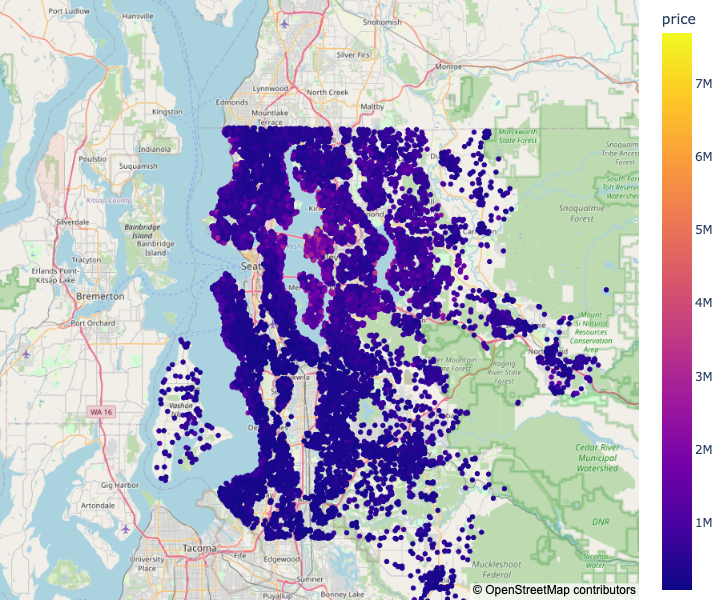

In [71]:

## VISUALIZATION: PRICE DISTRIBUTION IN MAP  

# Import plotly 

import plotly.express as px

# Generate map box displaying houses in their coordinates

fig = px.scatter_mapbox(df,
                        lat="lat",
                        lon="long",
                        hover_data=["zipcode"],
                        color="price",
                        #color_discrete_sequence=["fuchsia"],
                        zoom=8.55,
                        height=600)

# Generate streep map background

fig.update_layout(mapbox_style="open-street-map")  

# Remove margins

fig.update_layout(margin={"r":0,"t":0,"l":0,"b":0}) 

# Save map box as .png

fig.write_image("images/all_houses_mapbox.png")

# Display map box

fig.show()

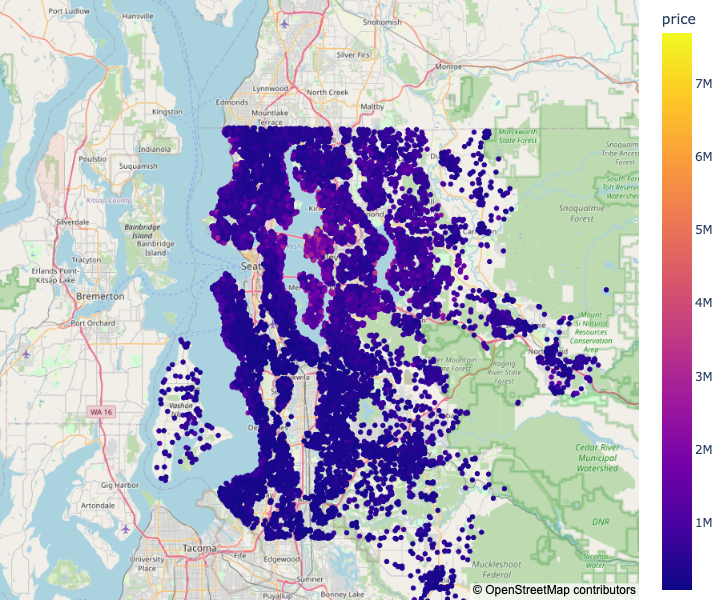

In [72]:

## VISUALIZATION: PRICE DISTRIBUTION IN MAP  

# Import plotly 

import plotly.express as px

# Generate map box displaying houses in their coordinates

fig = px.scatter_mapbox(df,
                        lat="lat",
                        lon="long",
                        hover_data=["zipcode"],
                        color="price",
                        #color_discrete_sequence=["fuchsia"],
                        zoom=8.55,
                        height=600)

# Generate streep map background

fig.update_layout(mapbox_style="open-street-map")  

# Remove margins

fig.update_layout(margin={"r":0,"t":0,"l":0,"b":0}) 

# Save map box as .png

fig.write_image("images/all_houses_mapbox.png")

# Display map box

fig.show()

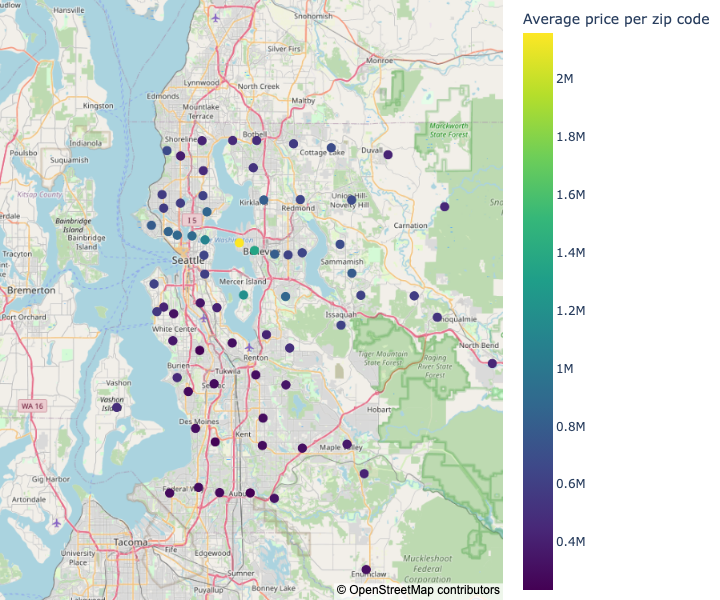

In [73]:

## VISUALIZATION: PRICE PER ZIP CODE 

# Generate map box displaying average price per ZIP code

fig = px.scatter_mapbox(df_prices,
                        lat="lat",
                        lon="long",
                        hover_data={"price": True, "zipcode":True},  # Enable hover data for the 'price' column
                        color="price",  # Use the 'price' column for coloring
                        color_continuous_scale=px.colors.sequential.Viridis,  # Set the color scale
                        zoom=8.55,
                        height=600)


# Update marker size

fig.update_traces(marker=dict(size=10))  # Adjust the size as needed

# Generate street map background

fig.update_layout(mapbox_style="open-street-map")  

# Remove margins

fig.update_layout(margin={"r": 0, "t": 0, "l": 0, "b": 0}) 

# Update colorbar title

fig.update_coloraxes(colorbar_title="Average price per zip code")

# Save map box as .png

fig.write_image("images/price_perzip_mapbox.png")

# Display map box

fig.show()

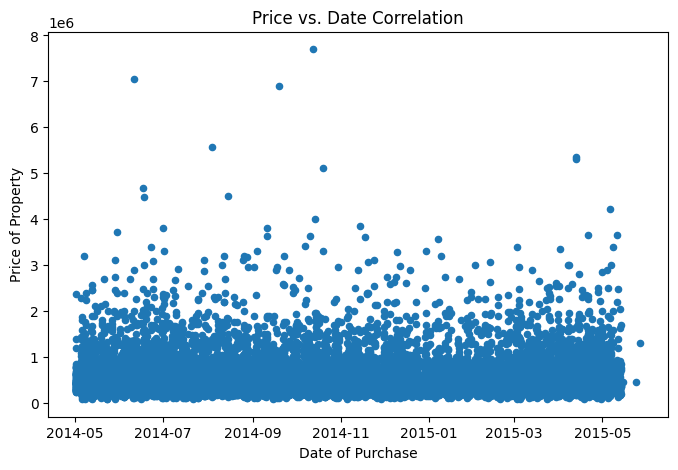

In [74]:

## VISUALIZATION: PRICE VS DATE OF PURCHASE

# Generate scatter plot displaying price vs date

price_vs_date = df.plot.scatter(x='date', y='price')

# Add axis labels and title to plot

price_vs_date.set_xlabel("Date of Purchase")  # Set the x-axis label
price_vs_date.set_ylabel("Price of Property")  # Set the y-axis label
price_vs_date.set_title("Price vs. Date Correlation")  # Set the title

# Save plot as .png

plt.savefig("images/price_vs_date.png")

# Display plot

plt.show()


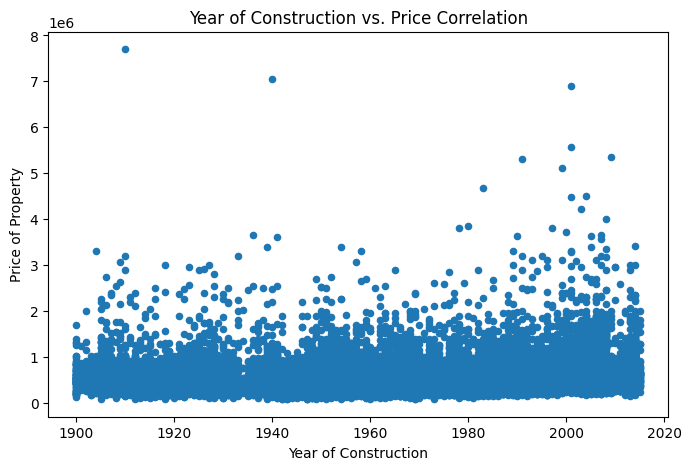

In [75]:

## VISUALIZATION: PRICE VS YEAR BUILT SCATTER 

# Generate scatter plot displaying price vs year of construction

construction_vs_price = df.plot.scatter(x='yr_built', y='price')

# Add axis labels and title to plot

construction_vs_price.set_xlabel("Year of Construction")  # Set the x-axis label
construction_vs_price.set_ylabel("Price of Property")  # Set the y-axis label
construction_vs_price.set_title("Year of Construction vs. Price Correlation")  # Set the title

# Save plot as .png

plt.savefig("images/construction_vs_price.png")

# Display plot

plt.show()


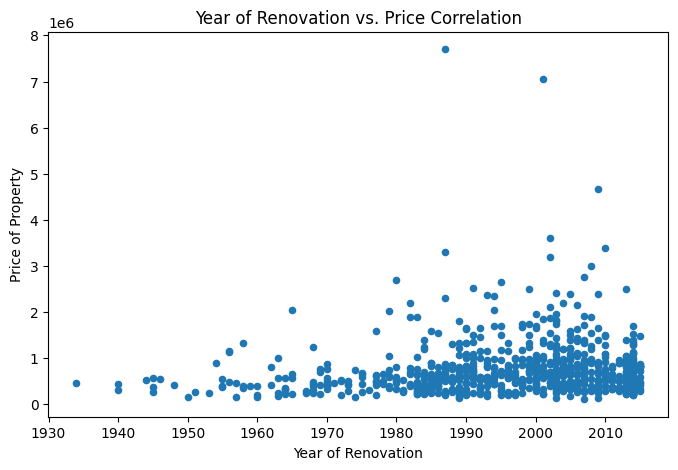

In [76]:

## VISUALIZATION: PRICE VS RENOVATION YEAR

# Generate scatter plot displaying price vs year of renovation

renovation_vs_price = df.plot.scatter(x='yr_renovated', y='price')

# Add axis labels and title to plot

renovation_vs_price.set_xlabel("Year of Renovation")  # Set the x-axis label
renovation_vs_price.set_ylabel("Price of Property")  # Set the y-axis label
renovation_vs_price.set_title("Year of Renovation vs. Price Correlation")  # Set the title

# Save plot as .png

plt.savefig("images/renovation_vs_price.png")

# Display plot

plt.show()


<Axes: xlabel='date'>

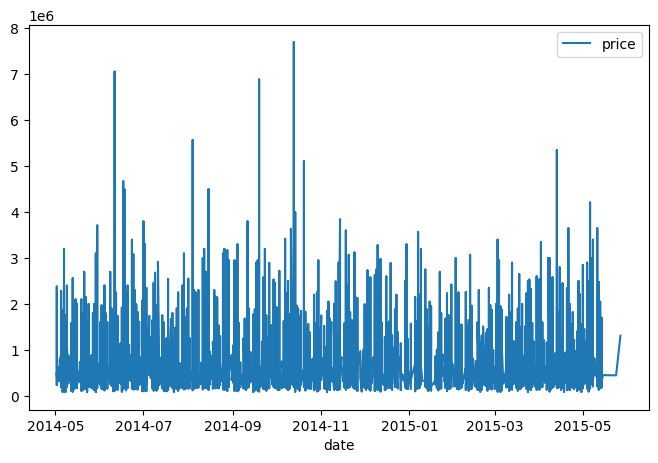

In [77]:

## EDA: LINE PLOTS 

#Line plots

df.plot(x='date', y='price', kind='line')

#df.plot(x='yr_renovated', y='price', kind='line')

#df.plot(x='yr_built', y='price', kind='line')



In [78]:
## EDA: PRICE OUTLIERS

# Find 

df.price.describe()

count     21597.000
mean     540296.574
std      367368.140
min       78000.000
25%      322000.000
50%      450000.000
75%      645000.000
max     7700000.000
Name: price, dtype: float64

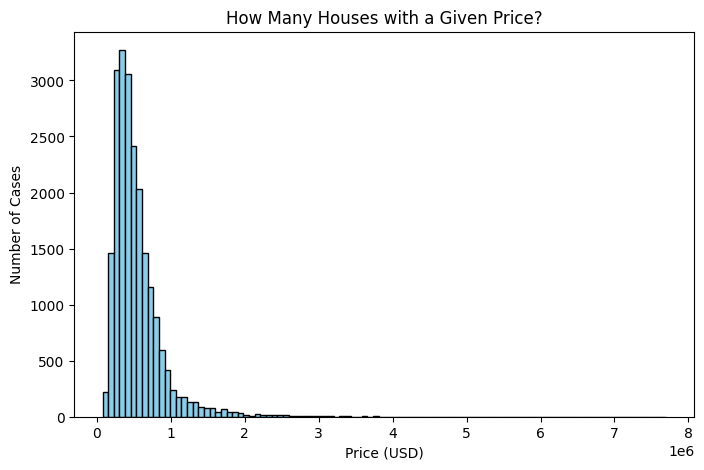

In [79]:

## VISUALIZATION: PRICE HISTOGRAM

# Create histogram
plt.hist(df["price"], bins=100, color='skyblue', edgecolor='black')

# Add labels and title
plt.xlabel('Price (USD)')
plt.ylabel('Number of Cases')
plt.title('How Many Houses with a Given Price?')

# Save plot
plt.savefig("images/price_histo.png")


# Show the plot
plt.show()


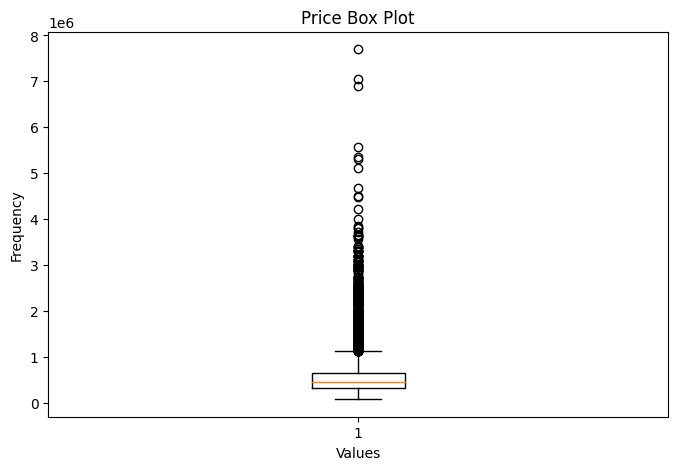

In [80]:

## VISUALIZATION: PRICE PLOT BOX


# Create a box plot
plt.boxplot(df["price"])

# Add labels and title
plt.xlabel('Values')
plt.ylabel('Frequency')
plt.title('Price Box Plot')

# Show the plot
plt.show()

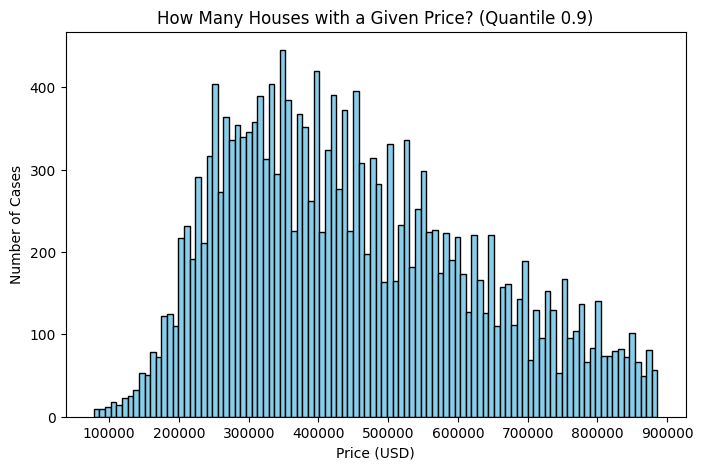

In [81]:
## EDA: PRICE OUTLIERS

# Keep prices below the .9 quantile only

df_cleaned = df.query("price < price.quantile(0.9)")

# Create new histogram

plt.hist(df_cleaned["price"], bins=100, color='skyblue', edgecolor='black')

# Add labels and title

plt.xlabel('Price (USD)')
plt.ylabel('Number of Cases')
plt.title('How Many Houses with a Given Price? (Quantile 0.9)')

# Show the plot

plt.show()

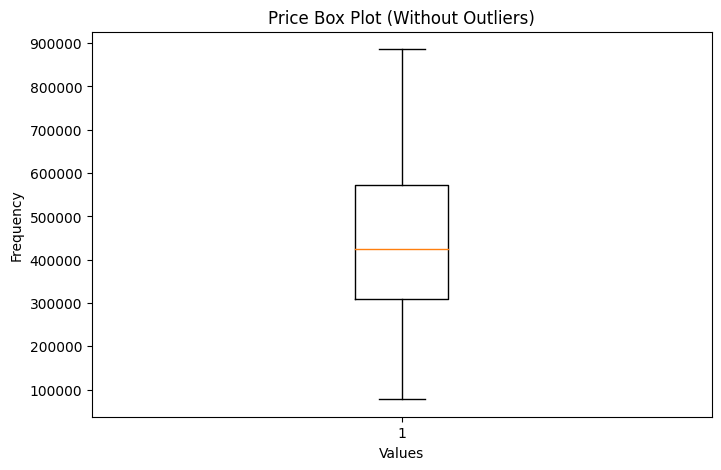

In [82]:

## VISUALIZATION: PRICE PLOT BOX (WITHOUT OUTLIERS)


# Create a box plot
plt.boxplot(df_cleaned["price"])

# Add labels and title
plt.xlabel('Values')
plt.ylabel('Frequency')
plt.title('Price Box Plot (Without Outliers)')

# Show the plot
plt.show()

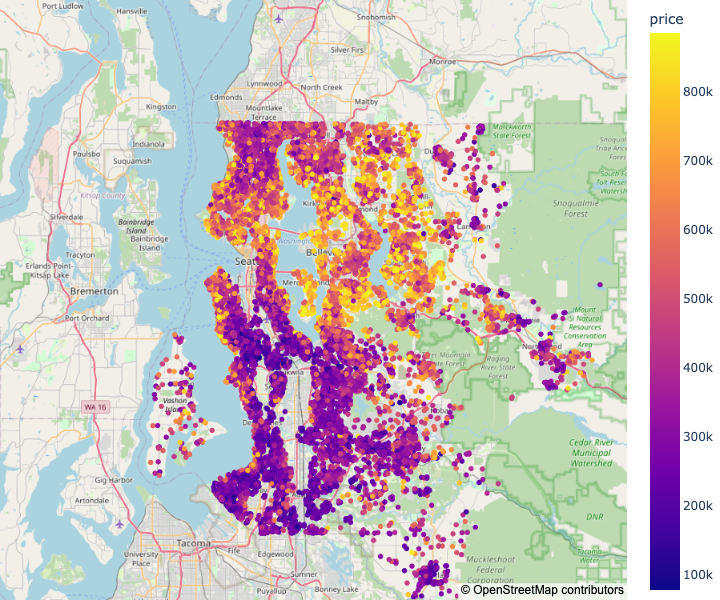

In [83]:

## VISUALIZATION: PRICE DISTRIBUTION IN MAP WITHOUT OUTLIERS

# Import plotly 

import plotly.express as px

# Generate map box displaying houses in their coordinates

fig = px.scatter_mapbox(df_cleaned,
                        lat="lat",
                        lon="long",
                        hover_data=["zipcode"],
                        color="price",
                        #color_discrete_sequence=["fuchsia"],
                        zoom=8.55,
                        height=600)

# Generate streep map background

fig.update_layout(mapbox_style="open-street-map")  

# Remove margins

fig.update_layout(margin={"r":0,"t":0,"l":0,"b":0}) 

# Save map box as .png

fig.write_image("images/all_houses_mapbox_clean.png")

# Display map box

fig.show()

In [84]:

## EDA: GEOGRAPHICAL ANALYSIS 

# Create new data frame 

df_cleaned_prices = df_cleaned.copy()

# Drop columns with date entries

df_cleaned_prices.drop(["yr_renovated", "yr_built", "date"], axis=1, inplace=True)

# Group houses by zip code and calculate mean price per zip code

df_cleaned_prices = df_cleaned_prices.groupby("zipcode").mean()

# Reset index

df_cleaned_prices.reset_index(inplace=True)

# Convert entries in "price" to int

df_cleaned_prices["price"] = df_cleaned_prices["price"].round().astype(int)

# Check that it all worked

print(df_cleaned_prices)

    zipcode    lat     long   price
0     98001 47.309 -122.271  281195
1     98002 47.309 -122.213  234284
2     98003 47.316 -122.310  291760
3     98004 47.612 -122.199  741361
4     98005 47.604 -122.168  686029
..      ...    ...      ...     ...
65    98177 47.743 -122.368  525270
66    98178 47.499 -122.247  302233
67    98188 47.447 -122.281  289078
68    98198 47.391 -122.316  293434
69    98199 47.649 -122.397  605908

[70 rows x 4 columns]


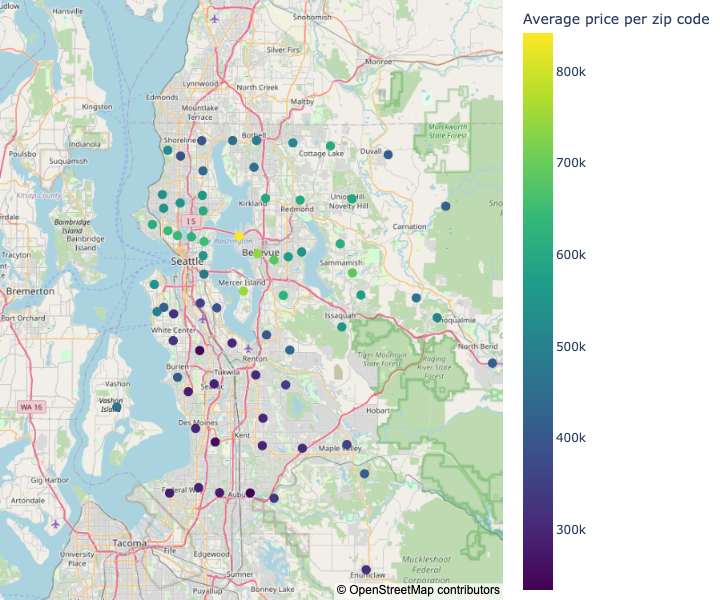

In [100]:

## VISUALIZATION: PRICE PER ZIP CODE (WITHOUT OUTLIERS)

# Generate map box displaying average price per ZIP code

fig = px.scatter_mapbox(df_cleaned_prices,
                        lat="lat",
                        lon="long",
                        hover_data={"price": True, "zipcode":True},  # Enable hover data for the 'price' column
                        color="price",  # Use the 'price' column for coloring
                        color_continuous_scale=px.colors.sequential.Viridis,  # Set the color scale
                        zoom=8.55,
                        height=600)


# Update marker size

fig.update_traces(marker=dict(size=10))  # Adjust the size as needed

# Generate street map background

fig.update_layout(mapbox_style="open-street-map")  

# Remove margins

fig.update_layout(margin={"r": 0, "t": 0, "l": 0, "b": 0}) 

# Update colorbar title

fig.update_coloraxes(colorbar_title="Average price per zip code")

# Save map box as .png

fig.write_image("images/price_perzip_mapbox_clean.png")

# Display map box

fig.show()

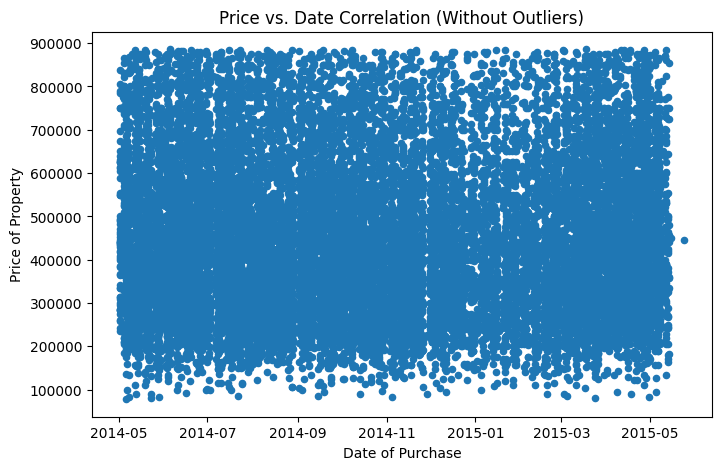

In [86]:
## VISUALIZATION: PRICE VS DATE OF PURCHASE (NO OUTLIERS)

# Generate scatter plot displaying price vs date

price_vs_date = df_cleaned.plot.scatter(x='date', y='price')

# Add axis labels and title to plot

price_vs_date.set_xlabel("Date of Purchase")  # Set the x-axis label
price_vs_date.set_ylabel("Price of Property")  # Set the y-axis label
price_vs_date.set_title("Price vs. Date Correlation (Without Outliers)")  # Set the title

# Save plot as .png

plt.savefig("images/price_vs_date_cleaned.png")

# Display plot

plt.show()


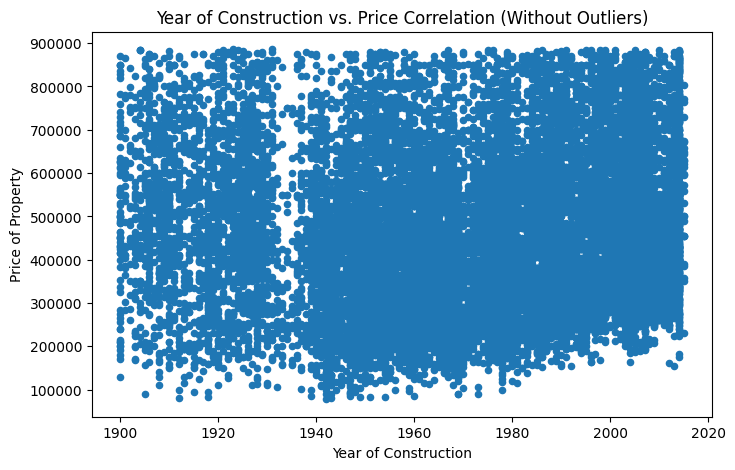

In [87]:

## VISUALIZATION: PRICE VS YEAR BUILT SCATTER (WITHOUT OUTLIERS)

# Generate scatter plot displaying price vs year of construction

construction_vs_price = df_cleaned.plot.scatter(x='yr_built', y='price')

# Add axis labels and title to plot

construction_vs_price.set_xlabel("Year of Construction")  # Set the x-axis label
construction_vs_price.set_ylabel("Price of Property")  # Set the y-axis label
construction_vs_price.set_title("Year of Construction vs. Price Correlation (Without Outliers)")  # Set the title

# Save plot as .png

plt.savefig("images/construction_vs_price_clean.png")

# Display plot

plt.show()


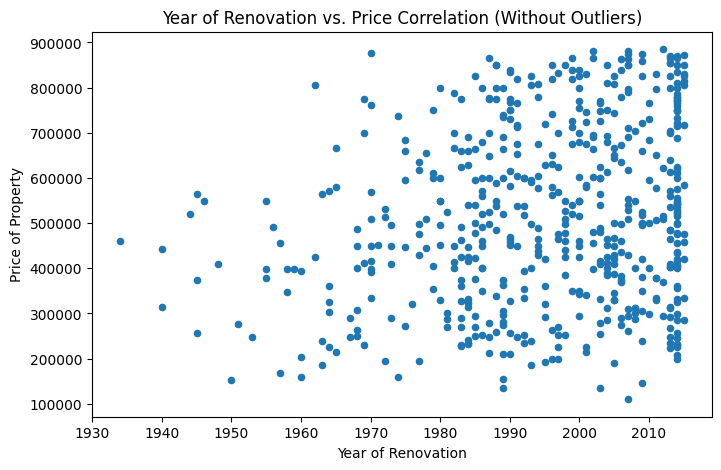

In [88]:

## VISUALIZATION: PRICE VS RENOVATION YEAR (WITHOUT OUTLIERS)

# Generate scatter plot displaying price vs year of renovation

renovation_vs_price = df_cleaned.plot.scatter(x='yr_renovated', y='price')

# Add axis labels and title to plot

renovation_vs_price.set_xlabel("Year of Renovation")  # Set the x-axis label
renovation_vs_price.set_ylabel("Price of Property")  # Set the y-axis label
renovation_vs_price.set_title("Year of Renovation vs. Price Correlation (Without Outliers)")  # Set the title

# Save plot as .png

plt.savefig("images/renovation_vs_price_clean.png")

# Display plot

plt.show()

In [89]:

## EDA: CENTRAL ZIP CODES

# Select central zip codes in main data frame

df_center = df.query("zipcode == 98101 | zipcode == 98102 | zipcode == 98104 | zipcode == 98122 | zipcode == 98112 | zipcode == 98144 | zipcode == 98108 | zipcode == 98118")

# Select central zip codes in frame with zip code groupings

df_prices_center = df_prices.query("zipcode == 98101 | zipcode == 98102 | zipcode == 98104 | zipcode == 98122 | zipcode == 98112 | zipcode == 98144 | zipcode == 98108 | zipcode == 98118")

# Check that it worked

print(df_center)
print(df_prices_center)

       yr_built  yr_renovated  zipcode    lat     long        date      price
27         1909           NaN    98112 47.622 -122.314  2014-12-01 667000.000
64         1979           NaN    98122 47.611 -122.297  2014-06-03 425000.000
65         1925           NaN    98144 47.575 -122.304  2014-11-20 317625.000
82         1948           NaN    98118 47.547 -122.291  2014-10-28 355000.000
100        1910           NaN    98102 47.642 -122.315  2014-06-11 850830.000
...         ...           ...      ...    ...      ...         ...        ...
21562      2009           NaN    98144 47.593 -122.295  2014-06-23 362500.000
21567      1943           NaN    98102 47.641 -122.329  2014-06-10 399950.000
21588      2014           NaN    98144 47.570 -122.288  2015-01-26 429000.000
21594      2009           NaN    98144 47.594 -122.299  2014-06-23 402101.000
21596      2008           NaN    98144 47.594 -122.299  2014-10-15 325000.000

[1699 rows x 7 columns]
    zipcode    lat     long    price
41

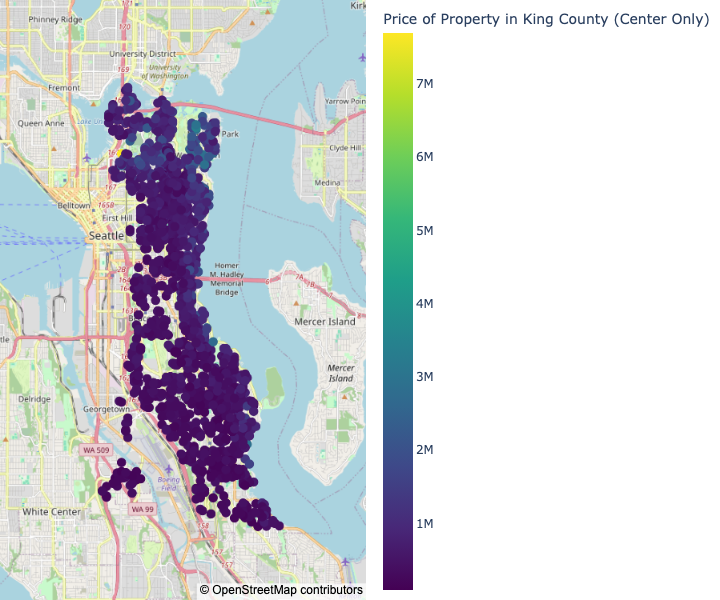

In [90]:

## VISUALIZATION: PRICE DISTRIBUTION IN MAP (ONLY CENTER)

# Generate map box displaying price of each propert in map

fig = px.scatter_mapbox(df_center,
                        lat="lat",
                        lon="long",
                        hover_data={"price": True, "zipcode":True},  # Enable hover data for the 'price' column
                        color="price",  # Use the 'price' column for coloring
                        color_continuous_scale=px.colors.sequential.Viridis,  # Set the color scale
                        zoom=10.55,
                        height=600)


# Update marker size

fig.update_traces(marker=dict(size=10))  # Adjust the size as needed

# Generate street map background

fig.update_layout(mapbox_style="open-street-map")  

# Remove margins

fig.update_layout(margin={"r": 0, "t": 0, "l": 0, "b": 0}) 

# Update colorbar title

fig.update_coloraxes(colorbar_title="Price of Property in King County (Center Only)")

# Save map box as .png

fig.write_image("images/mapbox_center.png")

# Display map box

fig.show()

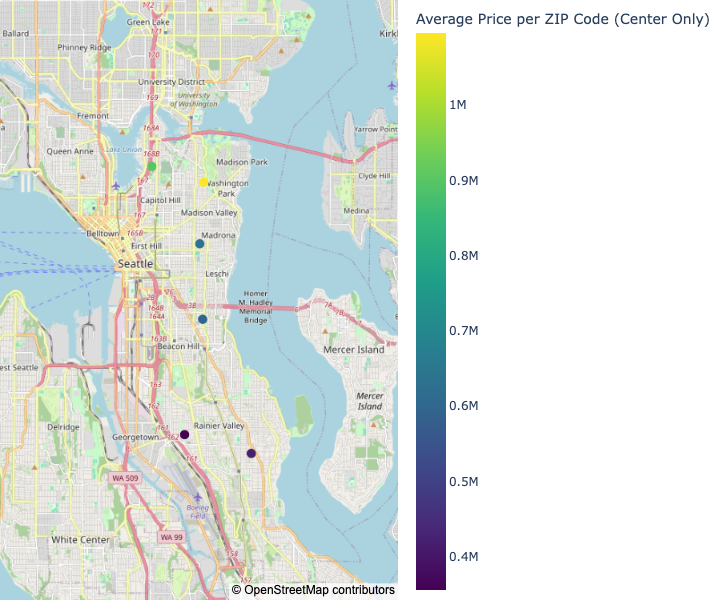

In [91]:

## VISUALIZATION: PRICE PER ZIP CODE (ONLY CENTER)

# Generate map box displaying average price per ZIP code

fig = px.scatter_mapbox(df_prices_center,
                        lat="lat",
                        lon="long",
                        hover_data={"price": True, "zipcode":True},  # Enable hover data for the 'price' column
                        color="price",  # Use the 'price' column for coloring
                        color_continuous_scale=px.colors.sequential.Viridis,  # Set the color scale
                        zoom=10.55,
                        height=600)


# Update marker size

fig.update_traces(marker=dict(size=10))  # Adjust the size as needed

# Generate street map background

fig.update_layout(mapbox_style="open-street-map")  

# Remove margins

fig.update_layout(margin={"r": 0, "t": 0, "l": 0, "b": 0}) 

# Update colorbar title

fig.update_coloraxes(colorbar_title="Average Price per ZIP Code (Center Only)")

# Save map box as .png

fig.write_image("images/price_perzip_mapbox_center.png")

# Display map box

fig.show()

In [92]:

## EDA: CENTRAL ZIP CODES (OUTLIERS ONLY)

# Set price threshold for central property at 90%

threshold = df_center["price"].quantile(0.9)

# Select top 90% priced property in center data frame 

df_center_outliers =  df_center.query("price > @threshold")

# Select top 90% priced property in frame with zip code groupings

df_prices_center_outliers =  df_prices_center.query("price > @threshold")

# Check that it worked

print(df_center_outliers)
print(df_prices_center_outliers)

       yr_built  yr_renovated  zipcode    lat     long        date       price
282        1905      1994.000    98122 47.617 -122.287  2015-05-13 2050000.000
518        1916           NaN    98112 47.642 -122.285  2014-11-14 2250000.000
779        1905           NaN    98112 47.620 -122.286  2014-06-12 2250000.000
1030       2008           NaN    98144 47.575 -122.283  2015-04-17 2450000.000
1215       1921           NaN    98122 47.617 -122.282  2014-12-22 1880000.000
...         ...           ...      ...    ...      ...         ...         ...
20353      2015           NaN    98112 47.636 -122.281  2015-04-07 1800000.000
20406      2014           NaN    98112 47.641 -122.307  2014-10-16 1290000.000
20812      2009           NaN    98144 47.593 -122.291  2015-02-18 1900000.000
20923      2013           NaN    98112 47.620 -122.289  2014-07-07 1300000.000
21300      2015           NaN    98112 47.622 -122.290  2015-03-10 1700000.000

[169 rows x 7 columns]
Empty DataFrame
Columns: [zi

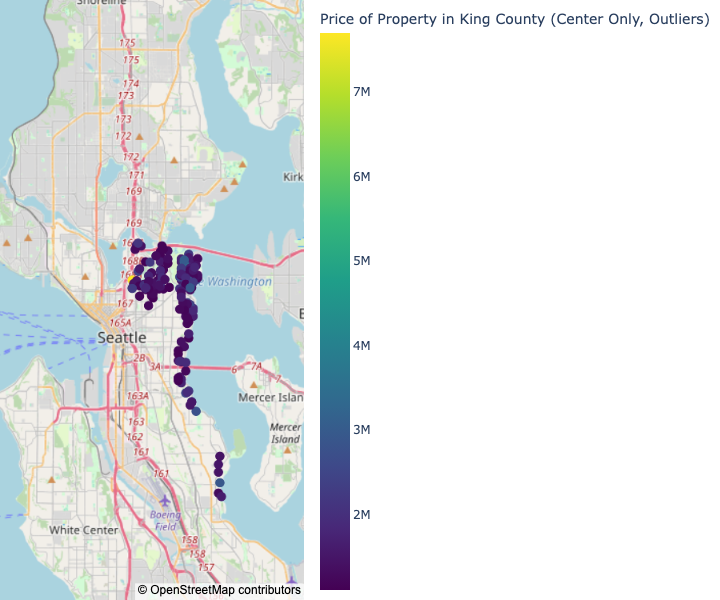

In [93]:

## VISUALIZATION: PRICE DISTRIBUTION IN MAP (ONLY CENTER, OUTLIERS)

# Generate map box displaying price of each propert in map

fig = px.scatter_mapbox(df_center_outliers,
                        lat="lat",
                        lon="long",
                        hover_data={"price": True, "zipcode":True},  # Enable hover data for the 'price' column
                        color="price",  # Use the 'price' column for coloring
                        color_continuous_scale=px.colors.sequential.Viridis,  # Set the color scale
                        zoom=10.55,
                        height=600)


# Update marker size

fig.update_traces(marker=dict(size=10))  # Adjust the size as needed

# Generate street map background

fig.update_layout(mapbox_style="open-street-map")  

# Remove margins

fig.update_layout(margin={"r": 0, "t": 0, "l": 0, "b": 0}) 

# Update colorbar title

fig.update_coloraxes(colorbar_title="Price of Property in King County (Center Only, Outliers)")

# Save map box as .png

fig.write_image("images/mapbox_center_outliers.png")

# Display map box

fig.show()

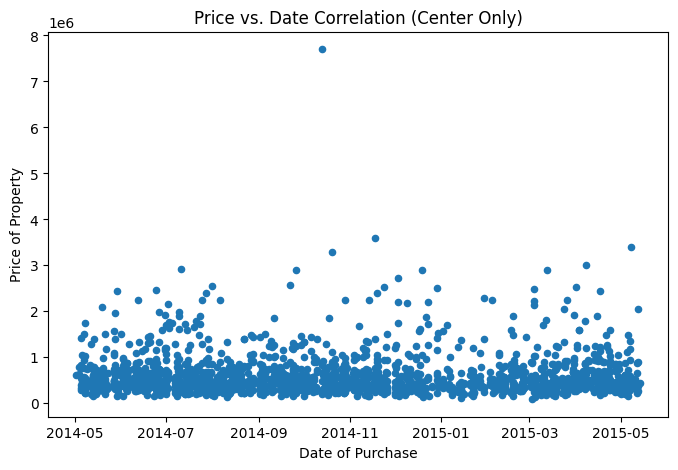

In [94]:
## VISUALIZATION: PRICE VS DATE OF PURCHASE (CENTER ONLY)

# Generate scatter plot displaying price vs date

price_vs_date = df_center.plot.scatter(x='date', y='price')

# Add axis labels and title to plot

price_vs_date.set_xlabel("Date of Purchase")  # Set the x-axis label
price_vs_date.set_ylabel("Price of Property")  # Set the y-axis label
price_vs_date.set_title("Price vs. Date Correlation (Center Only)")  # Set the title

# Save plot as .png

plt.savefig("images/price_vs_date_center.png")

# Display plot

plt.show()

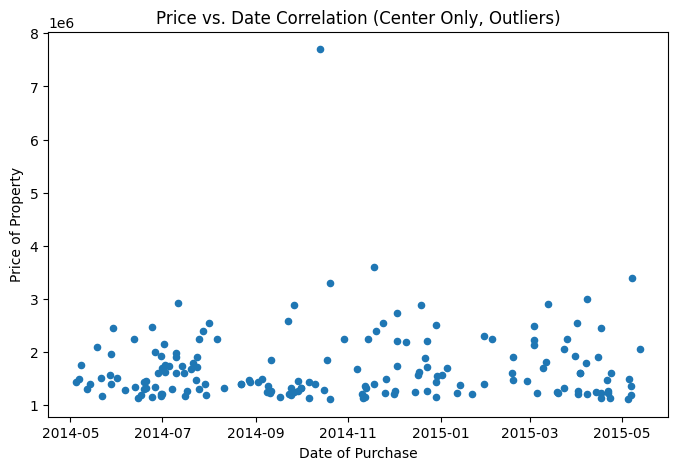

In [95]:
## VISUALIZATION: PRICE VS DATE OF PURCHASE (CENTER ONLY, OUTLIERS)

# Generate scatter plot displaying price vs date

price_vs_date = df_center_outliers.plot.scatter(x='date', y='price')

# Add axis labels and title to plot

price_vs_date.set_xlabel("Date of Purchase")  # Set the x-axis label
price_vs_date.set_ylabel("Price of Property")  # Set the y-axis label
price_vs_date.set_title("Price vs. Date Correlation (Center Only, Outliers)")  # Set the title

# Save plot as .png

plt.savefig("images/price_vs_date_center_outliers.png")

# Display plot

plt.show()

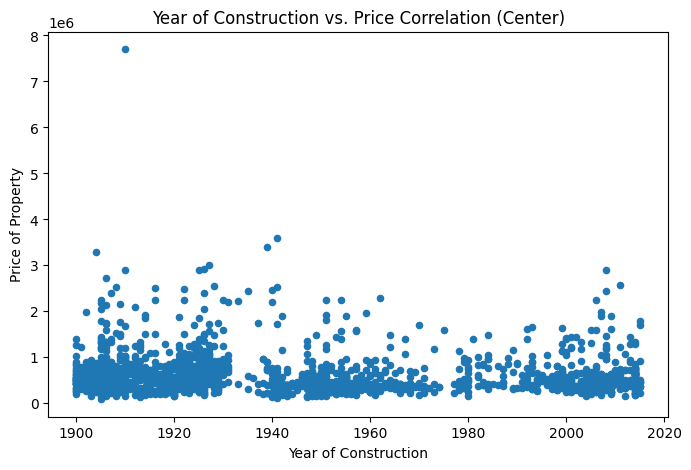

In [96]:
## VISUALIZATION: PRICE VS YEAR BUILT SCATTER (CENTER ONLY)

# Generate scatter plot displaying price vs year of construction

construction_vs_price = df_center.plot.scatter(x='yr_built', y='price')

# Add axis labels and title to plot

construction_vs_price.set_xlabel("Year of Construction")  # Set the x-axis label
construction_vs_price.set_ylabel("Price of Property")  # Set the y-axis label
construction_vs_price.set_title("Year of Construction vs. Price Correlation (Center)")  # Set the title

# Save plot as .png

plt.savefig("images/construction_vs_price_center.png")

# Display plot

plt.show()

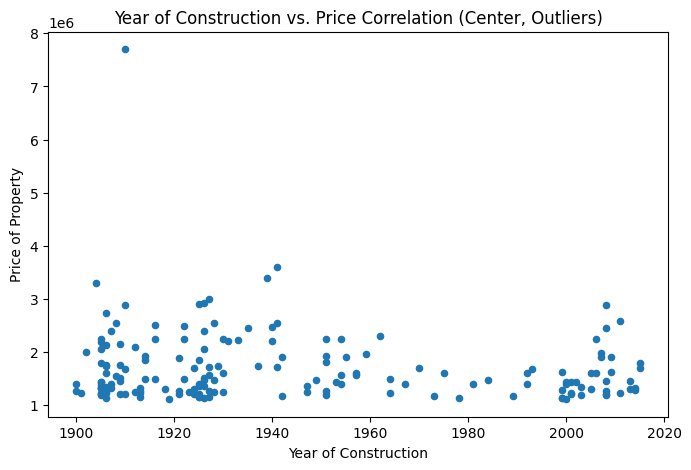

In [97]:
## VISUALIZATION: PRICE VS YEAR BUILT SCATTER (CENTER ONLY, OUTLIERS)

# Generate scatter plot displaying price vs year of construction

construction_vs_price = df_center_outliers.plot.scatter(x='yr_built', y='price')

# Add axis labels and title to plot

construction_vs_price.set_xlabel("Year of Construction")  # Set the x-axis label
construction_vs_price.set_ylabel("Price of Property")  # Set the y-axis label
construction_vs_price.set_title("Year of Construction vs. Price Correlation (Center, Outliers)")  # Set the title

# Save plot as .png

plt.savefig("images/construction_vs_price_center_outliers.png")

# Display plot

plt.show()

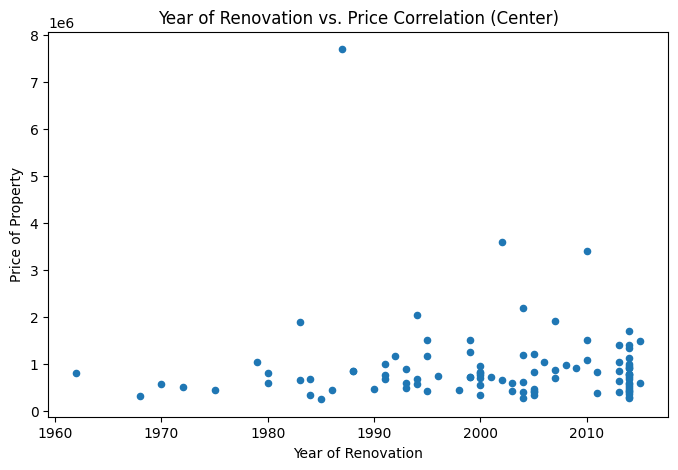

In [98]:

## VISUALIZATION: PRICE VS RENOVATION YEAR (CENTER)

# Generate scatter plot displaying price vs year of renovation

renovation_vs_price = df_center.plot.scatter(x='yr_renovated', y='price')

# Add axis labels and title to plot

renovation_vs_price.set_xlabel("Year of Renovation")  # Set the x-axis label
renovation_vs_price.set_ylabel("Price of Property")  # Set the y-axis label
renovation_vs_price.set_title("Year of Renovation vs. Price Correlation (Center)")  # Set the title

# Save plot as .png

plt.savefig("images/renovation_vs_price_center.png")

# Display plot

plt.show()

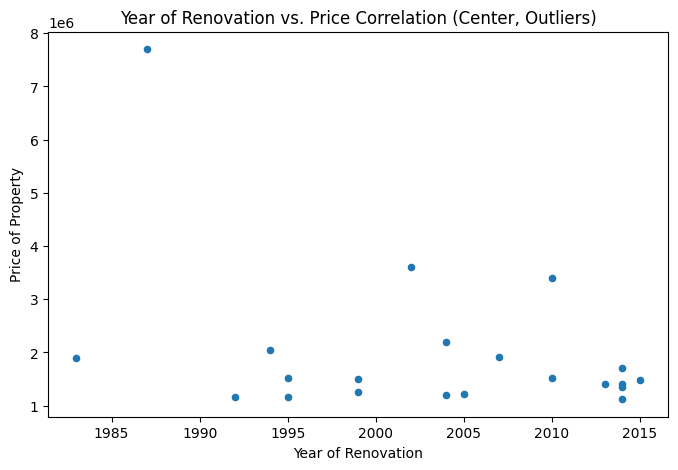

In [99]:

## VISUALIZATION: PRICE VS RENOVATION YEAR (CENTER ONLY, OUTLIERS)

# Generate scatter plot displaying price vs year of renovation

renovation_vs_price = df_center_outliers.plot.scatter(x='yr_renovated', y='price')

# Add axis labels and title to plot

renovation_vs_price.set_xlabel("Year of Renovation")  # Set the x-axis label
renovation_vs_price.set_ylabel("Price of Property")  # Set the y-axis label
renovation_vs_price.set_title("Year of Renovation vs. Price Correlation (Center, Outliers)")  # Set the title

# Save plot as .png

plt.savefig("images/renovation_vs_price_center_outliers.png")

# Display plot

plt.show()